# Section 1 - Exploratory Data Analysis (EDA)



For Milestone 1, and for the rest of the parts, I wanted to explore crime data within a city (with Atlanta being chosen), a *very* high detailed data set found right here on Kaggle: https://www.kaggle.com/datasets/priscillapun/crime-in-atlanta-2017



In [ ]:
# all neceessary imports:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import skew, kurtosis


In [ ]:
# MAKE SURE THE CSV IS IMPORTED!!!!*****
read_csv = pd.read_csv('COBRA-YTD2017.csv')
df = pd.DataFrame(read_csv)

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26759 entries, 0 to 26758
Data columns (total 23 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   MI_PRINX           26759 non-null  int64  
 1   offense_id         26759 non-null  int64  
 2   rpt_date           26759 non-null  object 
 3   occur_date         26759 non-null  object 
 4   occur_time         26748 non-null  object 
 5   poss_date          26759 non-null  object 
 6   poss_time          26755 non-null  object 
 7   beat               26759 non-null  int64  
 8   apt_office_prefix  546 non-null    object 
 9   apt_office_num     4626 non-null   object 
 10  location           26759 non-null  object 
 11  MinOfucr           26759 non-null  int64  
 12  MinOfibr_code      26758 non-null  object 
 13  dispo_code         3800 non-null   object 
 14  MaxOfnum_victims   26684 non-null  float64
 15  Shift              26759 non-null  object 
 16  Avg Day            267

In [ ]:
# SHOW FIRST FEW ROWS FOR STRUCTURE

df.head(10)


,MI_PRINX,offense_id,rpt_date,occur_date,occur_time,poss_date,poss_time,beat,apt_office_prefix,apt_office_num,...,dispo_code,MaxOfnum_victims,Shift,Avg Day,loc_type,UC2 Literal,neighborhood,npu,x,y
0,8924155,173650072,12/31/2017,12/30/2017,23:15:00,12/31/2017,00:30:00,510,NaN,NaN,...,NaN,2.0,Morn,Sat,13.0,LARCENY-FROM VEHICLE,Downtown,M,-84.38013,33.75582
1,8924156,173650102,12/31/2017,12/18/2017,13:00:00,12/30/2017,22:00:00,501,NaN,NaN,...,NaN,1.0,Unk,Unk,13.0,LARCENY-FROM VEHICLE,Home Park,E,-84.39745,33.78674
2,8924157,173650144,12/31/2017,12/30/2017,22:01:00,12/31/2017,01:00:00,303,NaN,NaN,...,NaN,1.0,Morn,Sat,18.0,LARCENY-FROM VEHICLE,Mechanicsville,V,-84.39486,33.73760
3,8924158,173650149,12/31/2017,12/30/2017,20:00:00,12/31/2017,01:06:00,507,NaN,NaN,...,NaN,1.0,Eve,Sat,18.0,LARCENY-FROM VEHICLE,Castleberry Hill,M,-84.39887,33.75156
4,8924159,173650159,12/31/2017,12/31/2017,00:41:00,12/31/2017,00:48:00,409,NaN,NaN,...,NaN,2.0,Morn,Sun,18.0,LARCENY-FROM VEHICLE,Adams Park,R,-84.46522,33.72146
5,8924160,173650180,12/31/2017,12/30/2017,23:00:00,12/31/2017,01:26:00,612,NaN,NaN,...,NaN,1.0,Morn,Sun,18.0,LARCENY-FROM VEHICLE,East Atlanta,W,-84.34660,33.74006
6,8924161,173650236,12/31/2017,12/31/2017,01:55:00,12/31/2017,01:59:00,605,NaN,13,...,NaN,1.0,Morn,Sun,26.0,ROBBERY-PEDESTRIAN,Grant Park,W,-84.37373,33.74505
7,8924162,173650241,12/31/2017,12/31/2017,00:00:00,12/31/2017,02:00:00,603,NaN,NaN,...,NaN,1.0,Morn,Sun,18.0,LARCENY-FROM VEHICLE,Old Fourth Ward,M,-84.37190,33.77303
8,8924163,173650295,12/31/2017,12/30/2017,00:00:00,12/31/2017,03:02:00,605,NaN,NaN,...,NaN,1.0,Unk,Sat,13.0,LARCENY-FROM VEHICLE,Grant Park,W,-84.37285,33.74639
9,8924164,173650389,12/31/2017,12/31/2017,00:00:00,12/31/2017,03:34:00,304,NaN,8,...,NaN,1.0,Morn,Sun,26.0,BURGLARY-RESIDENCE,Peoplestown,V,-84.38625,33.72579


In [ ]:
df.describe()


,MI_PRINX,offense_id,beat,MinOfucr,MaxOfnum_victims,loc_type,x,y
count,2.675900e+04,2.675900e+04,26759.000000,26759.000000,26684.000000,23415.000000,26759.000000,26759.000000
mean,8.910851e+06,6.523372e+08,355.640532,598.787062,1.159834,20.756652,-83.694373,33.474244
std,7.958873e+03,9.062584e+09,168.942553,112.199570,0.680471,16.011340,7.724556,3.089802
min,8.838438e+06,1.608219e+08,101.000000,110.000000,0.000000,1.000000,-84.549580,0.000000
25%,8.904204e+06,1.710602e+08,208.000000,521.000000,1.000000,13.000000,-84.432480,33.730010
50%,8.910894e+06,1.719703e+08,312.000000,640.000000,1.000000,18.000000,-84.395830,33.758050
75%,8.917584e+06,1.728213e+08,505.000000,660.000000,1.000000,20.000000,-84.371480,33.787875
max,8.924410e+06,1.734726e+11,710.000000,730.000000,27.000000,99.000000,0.000000,33.882700


In [ ]:
df.nunique() # unique values


,0
MI_PRINX,26759
offense_id,26759
rpt_date,365
occur_date,471
occur_time,1354
poss_date,412
poss_time,1433
beat,86
apt_office_prefix,87
apt_office_num,2049


In [ ]:
print(df.isna().sum()) # show missing values

MI_PRINX                 0
offense_id               0
rpt_date                 0
occur_date               0
occur_time              11
poss_date                0
poss_time                4
beat                     0
apt_office_prefix    26213
apt_office_num       22133
location                 0
MinOfucr                 0
MinOfibr_code            1
dispo_code           22959
MaxOfnum_victims        75
Shift                    0
Avg Day                  0
loc_type              3344
UC2 Literal              0
neighborhood          1185
npu                    260
x                        0
y                        0
dtype: int64


**Now with the data structure laid out, we get into data distributions**

To get a broad overview of all the columns that pertain numerical values, going through an array of

(Numeric columns: ['MI_PRINX', 'offense_id', 'beat', 'MinOfucr', 'MaxOfnum_victims', 'loc_type', 'x', 'y']
)

we are able to easily view all of them to see how if these speific values are categorical or continuous based on the data distribution  


Numeric columns: ['MI_PRINX', 'offense_id', 'beat', 'MinOfucr', 'MaxOfnum_victims', 'loc_type', 'x', 'y']


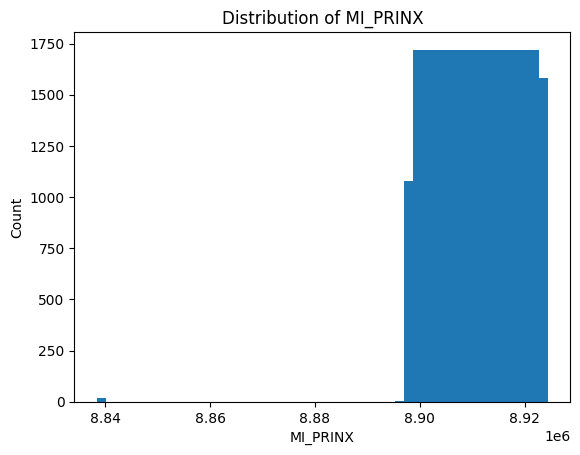

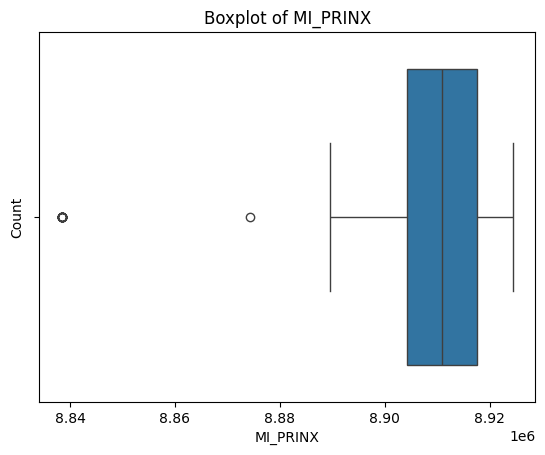

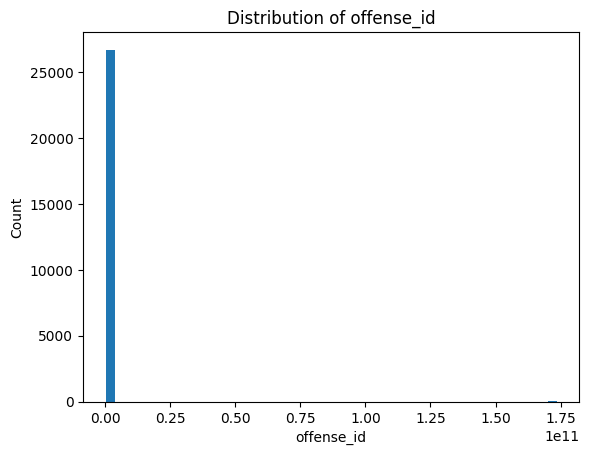

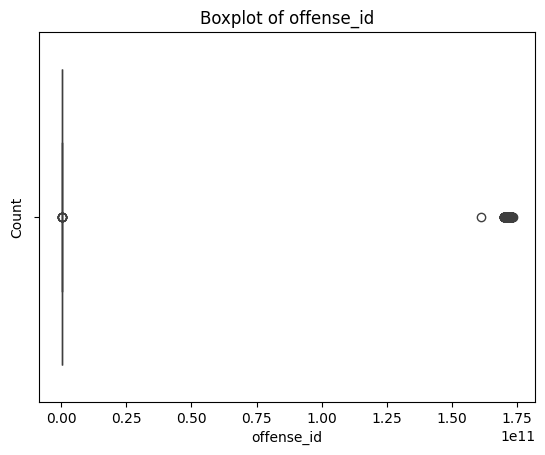

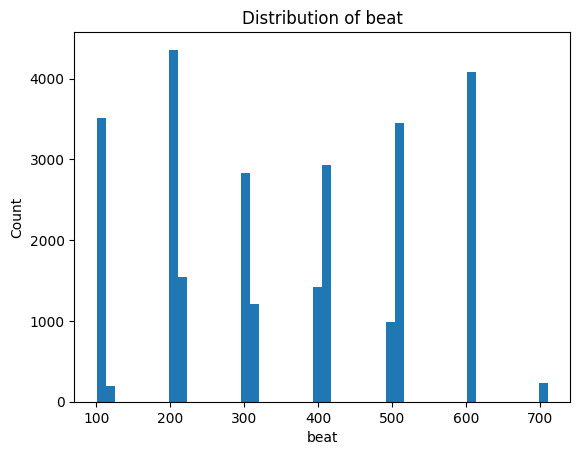

...

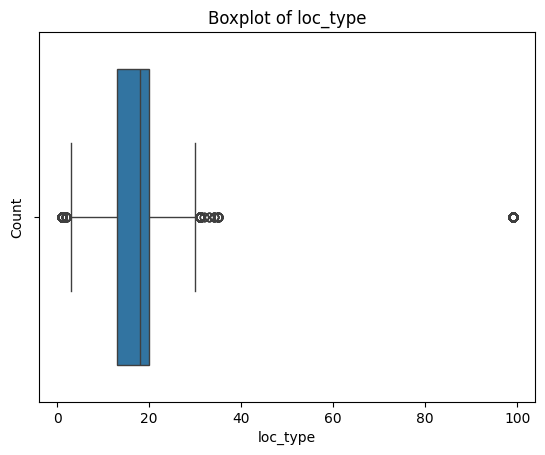

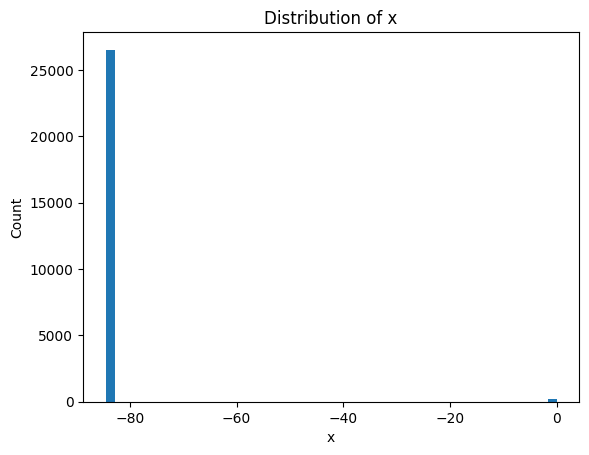

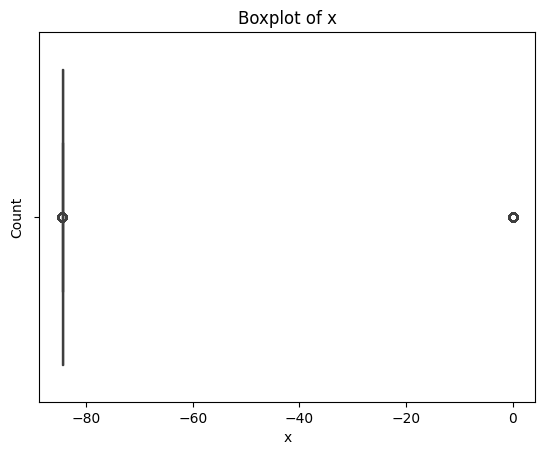

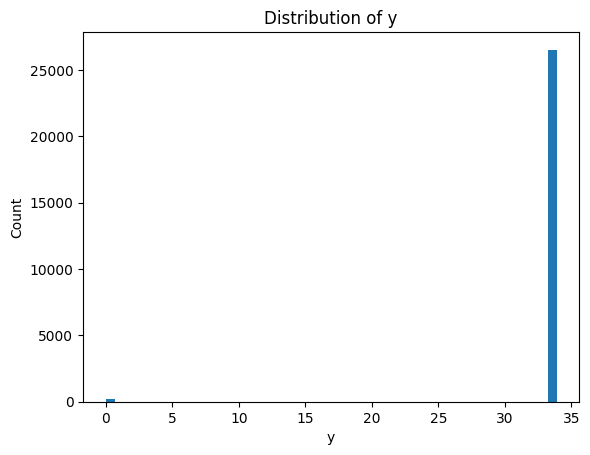

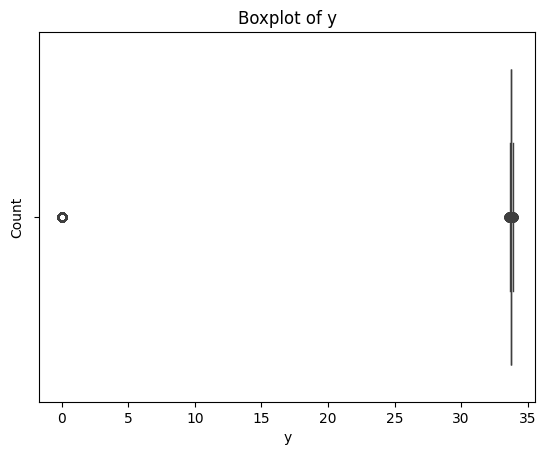

In [ ]:

numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
print("\nNumeric columns:", numeric_cols)

# every num histogram
for col in numeric_cols:
    plt.figure()
    plt.hist(df[col].dropna().values, bins=50)
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.show()

    plt.figure()
    sns.boxplot(x=df[col].dropna().values)
    plt.title(f"Boxplot of {col}")
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.show()



in which you can see from above, the only continous value that would be present in the dataset would be MaxOfnum_victims, as anything else would be categorized as categorical

**Bivariate Analysis**

**1.**

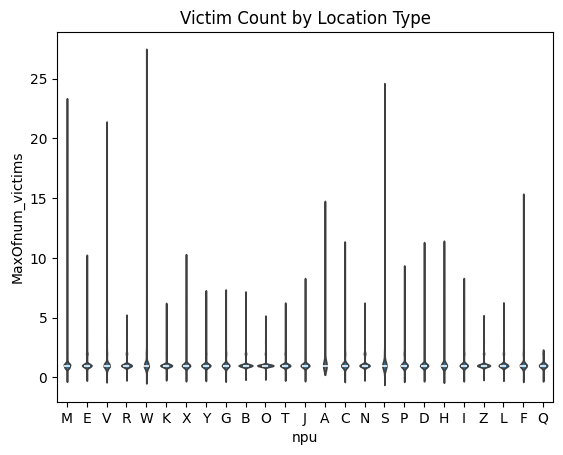

      count      mean       std  min  25%  50%  75%   max
npu                                                      
A     186.0  1.236559  1.094437  1.0  1.0  1.0  1.0  14.0
B    2714.0  1.120855  0.467270  0.0  1.0  1.0  1.0   7.0
C     470.0  1.142553  0.638911  0.0  1.0  1.0  1.0  11.0
D    1279.0  1.174355  0.669079  0.0  1.0  1.0  1.0  11.0
E    2739.0  1.193136  0.635230  0.0  1.0  1.0  1.0  10.0
F    1063.0  1.159925  0.745869  0.0  1.0  1.0  1.0  15.0
G     563.0  1.172291  0.623227  0.0  1.0  1.0  1.0   7.0
H     664.0  1.207831  0.804699  0.0  1.0  1.0  1.0  11.0
I    1070.0  1.160748  0.643272  0.0  1.0  1.0  1.0   8.0
J     753.0  1.130146  0.582600  0.0  1.0  1.0  1.0   8.0
K     525.0  1.078095  0.409333  0.0  1.0  1.0  1.0   6.0
L     652.0  1.138037  0.507360  0.0  1.0  1.0  1.0   6.0
M    3069.0  1.205930  0.895420  0.0  1.0  1.0  1.0  23.0
N     948.0  1.163502  0.494593  0.0  1.0  1.0  1.0   6.0
O     824.0  1.057039  0.327588  0.0  1.0  1.0  1.0   5.0
P     957.0  1

In [ ]:


# NPU relates to Neighborhood Planning Unit,
# entire list of the neighborhood list pertains to which npu is here:
# https://citycouncil.atlantaga.gov/other/neighborhood-planning-unit/npu-by-neighborhood/neighborhoods-by-npu

sns.violinplot(x="npu", y="MaxOfnum_victims", data=df)
plt.title("Victim Count by Location Type")
plt.show()

print(df.groupby("npu")["MaxOfnum_victims"].describe())


**2.**

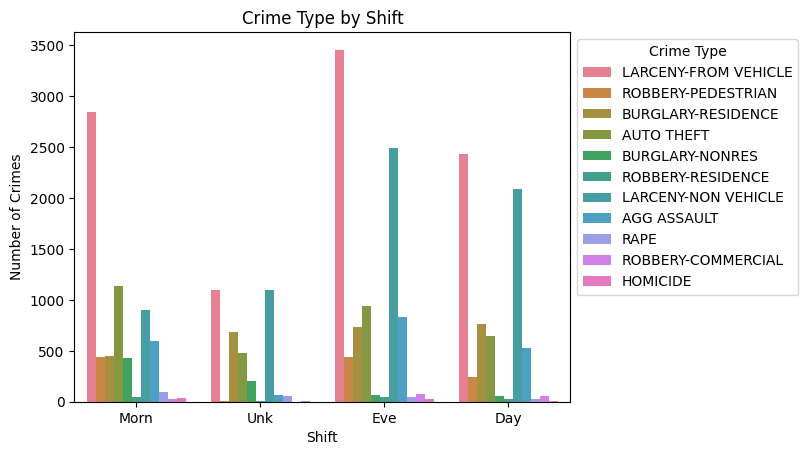

UC2 Literal  AGG ASSAULT  AUTO THEFT  BURGLARY-NONRES  BURGLARY-RESIDENCE  \
Shift                                                                       
Day                 0.08        0.09             0.01                0.11   
Eve                 0.09        0.10             0.01                0.08   
Morn                0.09        0.16             0.06                0.06   
Unk                 0.02        0.13             0.05                0.19   

UC2 Literal  HOMICIDE  LARCENY-FROM VEHICLE  LARCENY-NON VEHICLE  RAPE  \
Shift                                                                    
Day              0.00                  0.35                 0.30  0.00   
Eve              0.00                  0.38                 0.27  0.01   
Morn             0.01                  0.41                 0.13  0.01   
Unk              0.00                  0.30                 0.30  0.02   

UC2 Literal  ROBBERY-COMMERCIAL  ROBBERY-PEDESTRIAN  ROBBERY-RESIDENCE  
Shift              

In [ ]:
# UC2 = CRIME TYPE
# Shift vs Crime Type
sns.countplot(x="Shift", hue="UC2 Literal", data=df)
plt.title("Crime Type by Shift")
plt.ylabel("Number of Crimes")
plt.legend(title="Crime Type", bbox_to_anchor=(1, 1))
plt.show()

# Crosstab with percentages
print(pd.crosstab(df["Shift"], df["UC2 Literal"], normalize="index").round(2))


**3.**


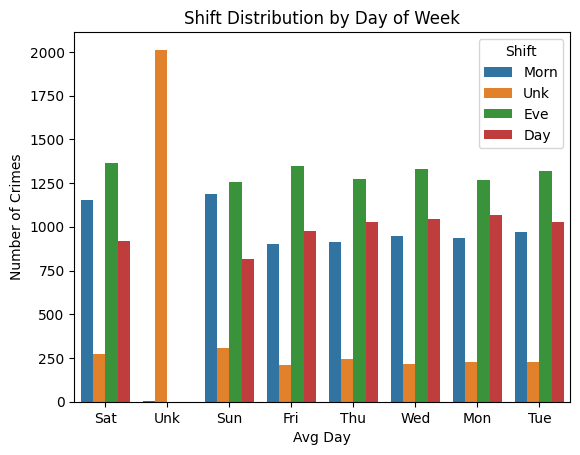

Shift     Day   Eve  Morn   Unk
Avg Day                        
Fri      0.28  0.39  0.26  0.06
Mon      0.31  0.36  0.27  0.06
Sat      0.25  0.37  0.31  0.07
Sun      0.23  0.35  0.33  0.09
Thu      0.30  0.37  0.26  0.07
Tue      0.29  0.37  0.27  0.06
Unk      0.00  0.00  0.00  1.00
Wed      0.30  0.38  0.27  0.06


In [ ]:
sns.countplot(x="Avg Day", hue="Shift", data=df)
plt.title("Shift Distribution by Day of Week")
plt.ylabel("Number of Crimes")
plt.legend(title="Shift", bbox_to_anchor=(1, 1))
plt.show()

print(pd.crosstab(df["Avg Day"], df["Shift"], normalize="index").round(2))


**4.**

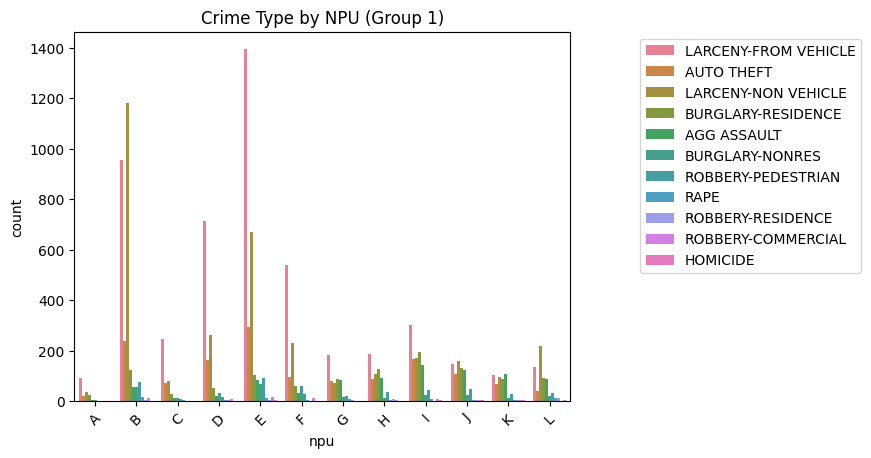

UC2 Literal  AGG ASSAULT  AUTO THEFT  BURGLARY-NONRES  BURGLARY-RESIDENCE  \
npu                                                                         
A                   0.02        0.11             0.03                0.13   
B                   0.02        0.09             0.02                0.05   
C                   0.03        0.16             0.03                0.06   
D                   0.02        0.13             0.03                0.04   
E                   0.03        0.11             0.02                0.04   
F                   0.03        0.09             0.06                0.06   
G                   0.15        0.14             0.03                0.16   
H                   0.14        0.13             0.02                0.19   
I                   0.13        0.16             0.02                0.18   
J                   0.16        0.14             0.03                0.17   
K                   0.20        0.13             0.03                0.17   

In [ ]:
# NPU SPLIT BY HALF FOR THIS BIVARIATE ANALYSIS

npus = sorted(df["npu"].dropna().unique())

# Split into two halves
half = len(npus) // 2  # 12 if 25 unique NPUs
first_half = npus[:half]
second_half = npus[half:]


sns.countplot(
    x="npu",
    hue="UC2 Literal",
    data=df[df["npu"].isin(first_half)],
    order=first_half
)
plt.title("Crime Type by NPU (Group 1)")
plt.xticks(rotation=45)
plt.legend(bbox_to_anchor=(1.6, 1))
plt.show()

print(pd.crosstab(
    df[df["npu"].isin(first_half)]["npu"],
    df[df["npu"].isin(first_half)]["UC2 Literal"],
    normalize="index"
).round(2))


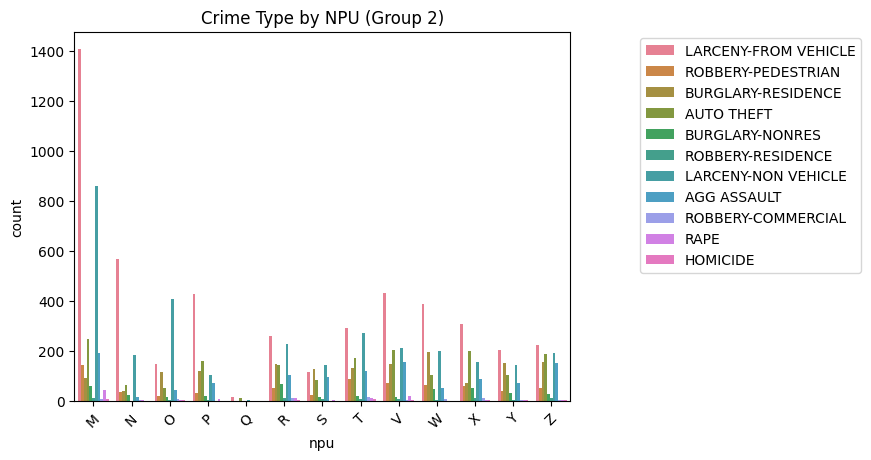

UC2 Literal  AGG ASSAULT  AUTO THEFT  BURGLARY-NONRES  BURGLARY-RESIDENCE  \
npu                                                                         
M                   0.06        0.08             0.02                0.03   
N                   0.02        0.07             0.03                0.04   
O                   0.06        0.06             0.02                0.14   
P                   0.08        0.17             0.02                0.13   
Q                   0.00        0.36             0.00                0.06   
R                   0.10        0.14             0.07                0.14   
S                   0.15        0.14             0.03                0.20   
T                   0.10        0.15             0.02                0.12   
V                   0.12        0.16             0.01                0.12   
W                   0.05        0.10             0.04                0.18   
X                   0.09        0.21             0.05                0.07   

In [ ]:
sns.countplot(
    x="npu",
    hue="UC2 Literal",
    data=df[df["npu"].isin(second_half)],
    order=second_half
)
plt.title("Crime Type by NPU (Group 2)")
plt.xticks(rotation=45)
plt.legend(bbox_to_anchor=(1.6, 1))
plt.show()

print(pd.crosstab(
    df[df["npu"].isin(second_half)]["npu"],
    df[df["npu"].isin(second_half)]["UC2 Literal"],
    normalize="index"
).round(2))


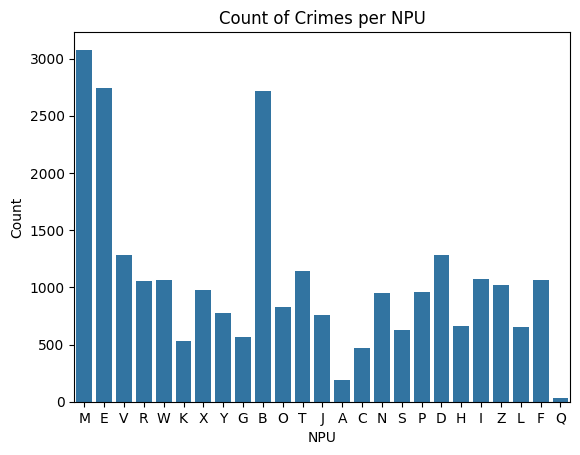

,count
npu,
M,3077
E,2742
B,2716
V,1281
D,1281
T,1140
I,1076
F,1064
W,1064


In [ ]:
# npu

sns.countplot(x='npu', data=df) # Use df instead of df_new
plt.title("Count of Crimes per NPU")
plt.xlabel("NPU")
plt.ylabel("Count")
plt.show()

df['npu'].value_counts(dropna=False) # show stats

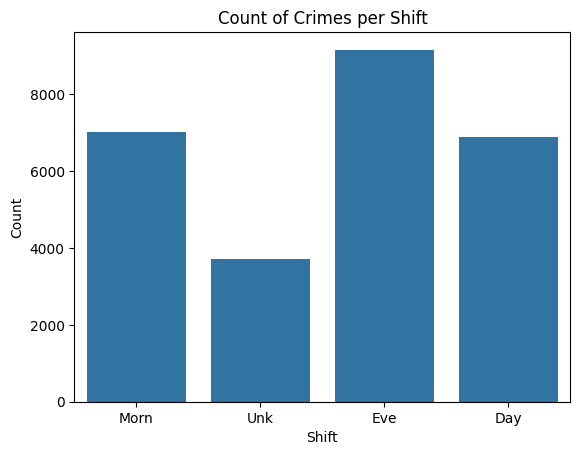

,count
Shift,
Eve,9151
Morn,7014
Day,6882
Unk,3712


In [ ]:
# Shift

sns.countplot(x='Shift', data=df) # Use df instead of df_new
plt.title("Count of Crimes per Shift")
plt.xlabel("Shift")
plt.ylabel("Count")
plt.show()

df['Shift'].value_counts(dropna=False) # show stats

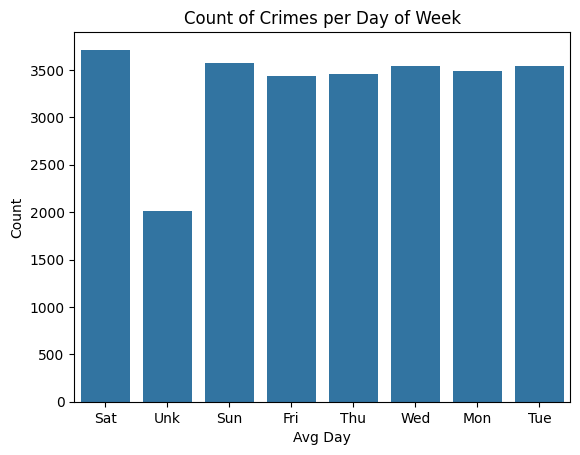

,count
Avg Day,
Sat,3713
Sun,3569
Tue,3542
Wed,3539
Mon,3492
Thu,3455
Fri,3434
Unk,2015


In [ ]:
# Avg Day

sns.countplot(x='Avg Day', data=df) # Use df instead of df_new
plt.title("Count of Crimes per Day of Week")
plt.xlabel("Avg Day")
plt.ylabel("Count")
plt.show()

df['Avg Day'].value_counts(dropna=False) # show stats

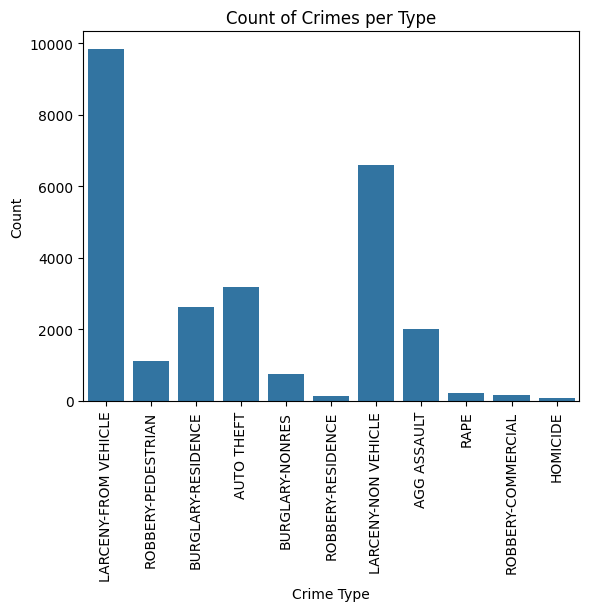

,count
UC2 Literal,
LARCENY-FROM VEHICLE,9840
LARCENY-NON VEHICLE,6589
AUTO THEFT,3197
BURGLARY-RESIDENCE,2635
AGG ASSAULT,2024
ROBBERY-PEDESTRIAN,1126
BURGLARY-NONRES,758
RAPE,226
ROBBERY-COMMERCIAL,157


In [ ]:
# UC2 Literal

sns.countplot(x='UC2 Literal', data=df) # Use df instead of df_new
plt.title("Count of Crimes per Type")
plt.xlabel("Crime Type")
plt.xticks(rotation=90)

plt.ylabel("Count")
plt.show()

df['UC2 Literal'].value_counts(dropna=False) # show stats

There are a few important things to note of the data so far.

maxNum_ofVictims - numbers are almost always low around 1-2, which is good for ease of mind. In the violin plot, you can see the shape around that 1-2 mark (with visible outliers visible of crimes per npu, which we can later potentially impute)

x, y - almost useless, can be imputed as with coordinates in any city the numbers are gonna be very close together; there are variables of loc_type and npu that can be a better use a classification model later

npu - you can see there are huge shifts in the amount of crime depending on the neighborhood, with 'Q' and 'A' for example being extremely low in comparison to 'M' (which only has three neighborhoods, but includes the downtown neighborhood in its unit)

UC2 Literal - Larceny is the biggest crime in 2017 Atlanta by a wide margin from looking at the dataset (theft without the use of violence/force), though it's still important to take out anything from here as all of it is important for a classification model later.

As for missing (or unknown) values, looking through the dataset, there are some cases of it being inconsistency like an 'Unk' value of 'shift' to a crime that has shown to take place at 8:00 AM in the dataset. In these cases they can be imputed or be filled in for the missing value to ensure consistency.

# Section 2 - Data Cleaning

In [ ]:
# WE WILL LOOK AT THIS DATASET WITH PANDAS PROFILING TO SEE WHAT CAN BE CLEANED

# Here I'll use the pandas profling block for further analysis
# that can't otherwise be seen other than looking through the CSV
!pip install pandas-profiling
!pip install ydata-profiling

  Using cached visions-0.8.1-py3-none-any.whl.metadata (11 kB)
Using cached visions-0.8.1-py3-none-any.whl (105 kB)
  Attempting uninstall: visions
    Found existing installation: visions 0.7.4
    Uninstalling visions-0.7.4:
      Successfully uninstalled visions-0.7.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pandas-profiling 3.2.0 requires visions[type_image_path]==0.7.4, but you have visions 0.8.1 which is incompatible.


In [ ]:
import pandas as pd
from ydata_profiling import ProfileReport

# Load your DataFrame
# Assuming 'df' is your DataFrame

# Create a profile report
profile = ProfileReport(df, title="Pandas Profiling Report", explorative=True)

# Display the report
profile.to_notebook_iframe()  # If using Jupyter Notebook

# To save the report as an HTML file:
profile.to_file("data_report_before_cleaning.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 23/23 [00:06<00:00,  3.76it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# MAKE COPY OF DF BEFORE ANY IMPUTING EXCLUDING ETC.

df_clean = df.copy()


In [ ]:

# DROP ANY MISSING 'occur_time' for next cell, only 11 cases
df_clean = df_clean.dropna(subset=['occur_time'])


In [ ]:
import re
# Convert occur_time to string and strip whitespace
s = df_clean['occur_time'].astype(str).str.strip()

# First attempt: parse standard AM/PM times like "11:15:00 PM"
t_ampm = pd.to_datetime(s, format="%I:%M:%S %p", errors="coerce")

# Second attempt: parse military-style 24h times like "23:15:00"
t_24 = pd.to_datetime(s, format="%H:%M:%S", errors="coerce")

# Third attempt: if it's just digits like "930" or "0930", extract the hour manually
digits = s.where(s.str.fullmatch(r"\d{1,4}"), np.nan)
h_digits = pd.to_numeric(digits.str.zfill(4).str[:2], errors="coerce")

# Combine the results:
#   1) If AM/PM parsed correctly, use that hour
#   2) Otherwise use 24h parsing
#   3) Otherwise fallback to digit-based hour extraction
hour = t_ampm.dt.hour.fillna(t_24.dt.hour).fillna(h_digits)

# Keep only valid 0–23, others -> NA
hour = hour.where(hour.between(0, 23), np.nan)
df_clean['hour'] = hour.astype('Int64')

# Map Hour to how it is on csv
def infer_shift(h):
    if pd.isna(h):
        return 'Unk'
    h = int(h)
    if 6 <= h < 12:
        return 'Morn'   # 06:00–11:59
    elif 12 <= h < 18:
        return 'Day'    # 12:00–17:59
    else:
        return 'Eve'    # 18:00–05:59

# Impute ONLY where Shift is unknown/missing
mask_unk = df_clean['Shift'].astype(str).str.lower().isin(['unk','unknown']) | df_clean['Shift'].isna()
df_clean.loc[mask_unk, 'Shift'] = df_clean.loc[mask_unk, 'hour'].map(infer_shift)

# Optional checks
print(df_clean['Shift'].value_counts(dropna=False))
print("Unk:", (df_clean['Shift'] == 'Unk').sum()) # ENSURE NO UNK

Shift
Eve     10602
Day      8329
Morn     7817
Name: count, dtype: int64
Unk: 0


In [ ]:
# FIX Avg Day ALSO

# Convert occur_date into a proper datetime format
# (coerce=True turns invalid/missing values into NaT safely)
df_clean['occur_date'] = pd.to_datetime(df_clean['occur_date'], errors='coerce')

# Extract the actual day name (Monday, Tuesday, etc.)
# This automatically fixes missing or incorrect 'Avg Day' entries
df_clean['Avg Day'] = df_clean['occur_date'].dt.day_name()

# Optional check: make sure no missing or weird day values remain
print(df_clean['Avg Day'].value_counts(dropna=False))


Avg Day
Saturday     4128
Friday       3885
Wednesday    3787
Tuesday      3778
Monday       3778
Sunday       3711
Thursday     3681
Name: count, dtype: int64


In [ ]:
# NOW WITH SHIFT AND AVG DAY TAKEN CARE OF,
# IMPUTE MISSING VALUES THAT AREN'T CRITICAL

df_clean['MinOfibr_code'] = df_clean['MinOfibr_code'].fillna('Unknown')
print(df_clean['MinOfibr_code'].value_counts(dropna=False))
print("MinOfibr_code Unknowns:", (df_clean['MinOfibr_code'] == 'Unknown').sum())


df_clean['MaxOfnum_victims'] = df_clean['MaxOfnum_victims'].fillna('Unknown')
print(df_clean['MaxOfnum_victims'].value_counts(dropna=False))
print("MaxOfnum_victims Unknowns:", (df_clean['MaxOfnum_victims'] == 'Unknown').sum())

df_clean['npu'] = df_clean['npu'].fillna('Unknown')
print(df_clean['npu'].value_counts(dropna=False))
print("npu Unknowns:", (df_clean['npu'] == 'Unknown').sum())

df_clean['loc_type'] = df_clean['loc_type'].fillna('Unknown')
print(df_clean['loc_type'].value_counts(dropna=False))
print("loc_type Unknowns:", (df_clean['loc_type'] == 'Unknown').sum())

df_clean['neighborhood'] = df_clean['neighborhood'].fillna('Unknown')
print(df_clean['neighborhood'].value_counts(dropna=False))
print("Neighborhood Unknowns:", (df_clean['neighborhood'] == 'Unknown').sum())

MinOfibr_code
2305       9024
2404       2774
2303       2486
2399       1946
2202       1802
           ... 
2318          1
Unknown       1
1299K         1
1202J         1
1102A         1
Name: count, Length: 68, dtype: int64
MinOfibr_code Unknowns: 1
MaxOfnum_victims
1.0        23528
2.0         2169
3.0          470
0.0          208
4.0          171
Unknown       64
5.0           58
6.0           27
7.0           21
8.0           11
11.0           4
10.0           4
14.0           2
13.0           2
9.0            2
21.0           1
23.0           1
15.0           1
24.0           1
17.0           1
27.0           1
19.0           1
Name: count, dtype: int64
MaxOfnum_victims Unknowns: 64
npu
M          3077
E          2742
B          2716
D          1280
V          1279
T          1140
I          1074
F          1064
W          1064
R          1051
Z          1019
X           980
P           957
N           948
O           827
Y           772
J           757
H           666
L      

In [ ]:


# for poss_time, fill with midnight -
df_clean['poss_time'] = df_clean['poss_time'].fillna('12:00:00 AM')
print(df_clean['poss_time'].value_counts(dropna=False))
print("poss_time Unknowns:", (df_clean['poss_time'] == '12:00:00 AM').sum())

poss_time
08:00:00    526
07:00:00    430
12:00:00    426
09:00:00    376
10:00:00    376
           ... 
05:51:00      1
06:42:00      1
05:01:00      1
03:58:00      1
04:32:00      1
Name: count, Length: 1434, dtype: int64
poss_time Unknowns: 3


In [ ]:
# AFTER FILLING THIS IN, WE WILL IMPUTE EXCLUDE ANY VALUES THAT
# HAVE BOTH NPU AND NEIGHBORHOOD MISSING, AS THIS CAN BE AN ANNOYING PROBLEM
# LATER OF HAVING TO MANUALLY CHECK, ATLANTA HAS ALL NPU AND NEIGHBORHOODS
# LISTED ONLINE, WITH EACH FIELD BEING DISCOVERABLE IF NEIGHBORHOOD IS ON THE DATASET
# AND NPU ISN'T (AND VICE VERSEA)

df_clean = df_clean[~((df_clean['npu'] == 'Unknown') & (df_clean['neighborhood'] == 'Unknown'))]
print(df_clean[(df_clean['npu'] == 'Unknown') & (df_clean['neighborhood'] == 'Unknown')].shape)


(0, 24)


In [ ]:

# DROP COLUMNS WITH SEVERAL UNKNOWN VALUES:
df_clean = df_clean.drop(columns=['apt_office_prefix', 'apt_office_num', 'dispo_code'])


In [ ]:
# LETS CHECK IT OUT NOW
df_clean.head()


,MI_PRINX,offense_id,rpt_date,occur_date,occur_time,poss_date,poss_time,beat,location,MinOfucr,...,MaxOfnum_victims,Shift,Avg Day,loc_type,UC2 Literal,neighborhood,npu,x,y,hour
0,8924155,173650072,12/31/2017,2017-12-30,23:15:00,12/31/2017,00:30:00,510,43 JESSE HILL JR DR NE,640,...,2.0,Morn,Saturday,13.0,LARCENY-FROM VEHICLE,Downtown,M,-84.38013,33.75582,23
1,8924156,173650102,12/31/2017,2017-12-18,13:00:00,12/30/2017,22:00:00,501,1169 ATLANTIC DR NW,640,...,1.0,Day,Monday,13.0,LARCENY-FROM VEHICLE,Home Park,E,-84.39745,33.78674,13
2,8924157,173650144,12/31/2017,2017-12-30,22:01:00,12/31/2017,01:00:00,303,633 PRYOR ST SW,640,...,1.0,Morn,Saturday,18.0,LARCENY-FROM VEHICLE,Mechanicsville,V,-84.39486,33.73760,22
3,8924158,173650149,12/31/2017,2017-12-30,20:00:00,12/31/2017,01:06:00,507,333 NELSON ST SW,640,...,1.0,Eve,Saturday,18.0,LARCENY-FROM VEHICLE,Castleberry Hill,M,-84.39887,33.75156,20
4,8924159,173650159,12/31/2017,2017-12-31,00:41:00,12/31/2017,00:48:00,409,2348 CASCADE RD SW,640,...,2.0,Morn,Sunday,18.0,LARCENY-FROM VEHICLE,Adams Park,R,-84.46522,33.72146,0


In [ ]:
# Double check

import pandas as pd
from ydata_profiling import ProfileReport

# Load your DataFrame
# USING df_clean NOW

# Create a profile report
profile = ProfileReport(df_clean, title="Pandas Profiling Report", explorative=True)

# Display the report
profile.to_notebook_iframe()  # If using Jupyter Notebook

# To save the report as an HTML file:
profile.to_file("data_report_after_cleaning.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 21/21 [00:02<00:00,  8.47it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

**Summary of actions:**

Avg Day and Shift were edited to ensure that there were no 'Unknown' values, as with the entire dataset most of them were present, with a data value present to help figure out the Avg Day, and a timestamp variable to find out what shift it would be in. These parts were to crucial to ensure that there wasn't any Unknowns here, as it was entirely preventable with more safe data collection

values of MinOfibr_code, MaxOfnum_victims, npu, neighborhood, poss_time, and loc_type had to be imputed with 'Unknown' values in contrast as there not much to infer from other variables in the case of 'Unknowns'. IF npu and neighborhood both had 'Unknown' in this imputation case, they were taken out of the dataset as there isn't a huge indication of where the crime took place without heavy manual checking

Columns of ['apt_office_prefix', 'apt_office_num', 'dispo_code'] were dropped due to heavy amounts of missing values, making them moot to include in the cleaned dataset.




# Section 3 - Feature Engineering

In [ ]:
# With new features that could be added, we have a lot of time
# based variables that could be used for more variables.

# Make a is_weekend column based on Avg Day

df_clean['is_weekend'] = df_clean['Avg Day'].isin(['Saturday', 'Sunday']).astype(int)

# similarily a 'is_night' can be made based on the shift, we'll just do this as
# if its an evening shift, based on a notation that more crime is committed during
# the night time

df_clean['is_night'] = df_clean['Shift'].isin(['Eve']).astype(int)

# another feature that can be included can be reflected in how dangerous each
# npu can potentially be with a frequency variable added to reflect upon that

npu_counts = df_clean['npu'].value_counts()
df_clean['npu_frequency'] = df_clean['npu'].map(npu_counts)


df_clean.head()

,MI_PRINX,offense_id,rpt_date,occur_date,occur_time,poss_date,poss_time,beat,location,MinOfucr,...,loc_type,UC2 Literal,neighborhood,npu,x,y,hour,is_weekend,is_night,npu_frequency
0,8924155,173650072,12/31/2017,2017-12-30,23:15:00,12/31/2017,00:30:00,510,43 JESSE HILL JR DR NE,640,...,13.0,LARCENY-FROM VEHICLE,Downtown,M,-84.38013,33.75582,23,1,0,3077
1,8924156,173650102,12/31/2017,2017-12-18,13:00:00,12/30/2017,22:00:00,501,1169 ATLANTIC DR NW,640,...,13.0,LARCENY-FROM VEHICLE,Home Park,E,-84.39745,33.78674,13,0,0,2742
2,8924157,173650144,12/31/2017,2017-12-30,22:01:00,12/31/2017,01:00:00,303,633 PRYOR ST SW,640,...,18.0,LARCENY-FROM VEHICLE,Mechanicsville,V,-84.39486,33.73760,22,1,0,1279
3,8924158,173650149,12/31/2017,2017-12-30,20:00:00,12/31/2017,01:06:00,507,333 NELSON ST SW,640,...,18.0,LARCENY-FROM VEHICLE,Castleberry Hill,M,-84.39887,33.75156,20,1,1,3077
4,8924159,173650159,12/31/2017,2017-12-31,00:41:00,12/31/2017,00:48:00,409,2348 CASCADE RD SW,640,...,18.0,LARCENY-FROM VEHICLE,Adams Park,R,-84.46522,33.72146,0,1,0,1051


In [ ]:
# all the categorical values include Shift , Avg Day, npu, UC2 Literal,
# loc_type, and neighborhood that aren't categorized numerically,
# for now this will be inputted into another dataframe of
# 'encoded_example' so it won't necessarily overwrite the more clear
# categorized variables YET, as these include crimes and such that are valuable
# to have in plain english for now in that seperate dataset.

# also, the highest categorical information of neighborhood as
# 200+ unique values, these can still be useful in classifiying crimes at a later time.

encoded_example = pd.get_dummies(df_clean[['Shift',
                                           'Avg Day',
                                           'npu',
                                           'UC2 Literal',
                                           'loc_type',
                                           'neighborhood']],
                                 drop_first=True)


encoded_example.head()



,Shift_Eve,Shift_Morn,Avg Day_Monday,Avg Day_Saturday,Avg Day_Sunday,Avg Day_Thursday,Avg Day_Tuesday,Avg Day_Wednesday,npu_B,npu_C,...,neighborhood_Whitewater Creek,neighborhood_Whittier Mill Village,neighborhood_Wildwood (NPU-C),neighborhood_Wildwood (NPU-H),neighborhood_Wildwood Forest,neighborhood_Wilson Mill Meadows,neighborhood_Wisteria Gardens,neighborhood_Woodfield,neighborhood_Woodland Hills,neighborhood_Wyngate
0,False,True,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,True,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,True,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,True,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,True,False,False,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [ ]:
encoded_example.shape

(26489, 313)

In [ ]:
# normalize + standardize features

from sklearn.preprocessing import StandardScaler

num_feats = ['hour', 'MaxOfnum_victims']

# drop rows where hour/npu were "Unknown"
df_scaled_demo = df_clean[
    (df_clean['hour'] != "Unknown") &
    (df_clean['npu']  != "Unknown")
].copy()

# force numeric for BOTH features; bad strings -> NaN
df_scaled_demo['hour'] = pd.to_numeric(df_scaled_demo['hour'], errors='coerce')
df_scaled_demo['MaxOfnum_victims'] = pd.to_numeric(df_scaled_demo['MaxOfnum_victims'], errors='coerce')

# drop any rows that still have NaN in the numeric features
df_scaled_demo = df_scaled_demo.dropna(subset=num_feats)

# scale (does not touch df_clean)
scaler = StandardScaler()
scaled_vals = scaler.fit_transform(df_scaled_demo[num_feats])

scaled_df = pd.DataFrame(scaled_vals, columns=num_feats, index=df_scaled_demo.index)
scaled_df.head()


,hour,MaxOfnum_victims
0,1.432272,1.228350
1,-0.072302,-0.236093
2,1.281815,-0.236093
3,0.980900,-0.236093
4,-2.028249,1.228350


**Summary**

Adding features of 'is_weekend' and 'is_night' are quite simple, but it can be used to help provide a more accurate predition in the data later on. This is due to affirming predictions to the model for a less of a chance of more skewness later on. Another feature that showcased how much crimes are set to take place at a certain NPU gives an idea to the model and the user of how dangerous a specific place can be.

Encoding the categorical values are better for the model to interpret the data when it comes time for that. Some algorithms are fine without the encoding, but coming back to this part in the model can be great in helping ensure as an accurate prediction as possible.

The hour column that was created and the MaxOfnum_victims were standardized in showcasing how scaling can work on the only numerical values in this data. This can be helped later on as standarization can help prevent single numerical features dominate other during training of the model.



# Closing

Happy to ensure everything on this notebook is well documented for the graders to look over for this Milestone. With that being said, everything should be ready to go for the Model Development for the next Milestone.